In [1]:
import warnings
from tqdm.contrib.itertools import product
from tqdm.notebook import tqdm

import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

warnings.filterwarnings("ignore")

from typing import List, Optional, Union

import numpy as np
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from tsururu.models.torch_based.dlinear import DLinear_NN
from tsururu.dataset import IndexSlicer, Pipeline, TSDataset
from tsururu.model_training.trainer import MLTrainer
from tsururu.model_training.validator import KFoldCrossValidator
from tsururu.models.boost import CatBoost
from tsururu.strategies import (
    DirectStrategy,
    FlatWideMIMOStrategy,
    MIMOStrategy,
    RecursiveStrategy,
)
from tsururu.transformers import (
    DateSeasonsGenerator,
    DifferenceNormalizer,
    LagTransformer,
    LastKnownNormalizer,
    SequentialTransformer,
    StandardScalerTransformer,
    TargetGenerator,
    UnionTransformer,
)

from sklearn.metrics import mean_absolute_error

from tsururu.model_training.trainer import DLTrainer

In [30]:
def symmetric_mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs(y_true - y_pred) / ((np.abs(y_true) + np.abs(y_pred)) / 2))


def get_metrics_by_id(test_df: pd.DataFrame, preds_df: pd.DataFrame):
    merge_df = test_df.merge(preds_df, on=["id", "Date"], suffixes=("_true", "_pred"))
    metrics_df = (
        merge_df.groupby("id")
        .apply(
            lambda x: symmetric_mean_absolute_percentage_error(x["Demand_true"], x["Demand_pred"])
        )
        .reset_index()
    )
    return metrics_df


def pad_multivariate_time_series(data, pad_with=np.nan):
    data = data.copy()
    min_date = data["Date"].min()
    max_date = data["Date"].max()

    all_dates = pd.date_range(min_date, max_date)

    to_concat = []

    for unique_id in data["id"].unique():
        id_dates = data[data["id"] == unique_id]["Date"]
        missing_dates = all_dates.difference(id_dates)

        for missing_date in missing_dates:
            to_concat.append(
                pd.DataFrame(
                    {
                        "Date": [missing_date],
                        "id": [unique_id],
                        "Demand": [pad_with],
                    }
                )
            )

    data = pd.concat([data] + to_concat, ignore_index=True)
    data = data.sort_values(["id", "Date"]).reset_index(drop=True)

    return data

## Loading and initial preprocessing data

In [3]:
# Load the datasets
train_data = pd.read_csv("datasets/global/train_demand.csv")
test_data = pd.read_csv("datasets/global/test_demand.csv")

# Convert 'Date' column to datetime format
train_data["Date"] = pd.to_datetime(train_data["Date"], format="%d.%m.%Y", dayfirst=True)
test_data["Date"] = pd.to_datetime(test_data["Date"], format="%d.%m.%Y", dayfirst=True)

# Make val data
n_days_in_val = 28
val_data = train_data[
    train_data["Date"] > train_data["Date"].max() - pd.Timedelta(days=n_days_in_val)
].reset_index(drop=True)
train_data = train_data[
    train_data["Date"] <= train_data["Date"].max() - pd.Timedelta(days=n_days_in_val)
]

# Convert each column to the appropriate data type
for df in [train_data, val_data, test_data]:
    df["Store_id"] = df["Store_id"].astype("str")
    df["SKU_id"] = df["SKU_id"].astype("str")
    df["Promo"] = df["Promo"].fillna(0)

In [4]:
train_data.head()

,Store_id,SKU_id,Date,Promo,Demand,Regular_Price,Promo_Price
0,1,1,2015-01-01,0.0,22,163.78,NaN
1,1,1,2015-01-02,0.0,41,163.78,NaN
2,1,1,2015-01-03,0.0,35,163.78,NaN
3,1,1,2015-01-04,0.0,72,163.78,NaN
4,1,1,2015-01-05,0.0,25,163.78,NaN


In [5]:
val_data.head()

,Store_id,SKU_id,Date,Promo,Demand,Regular_Price,Promo_Price
0,1,1,2016-04-25,1.0,484,135.78,122.32
1,1,1,2016-04-26,0.0,107,135.78,NaN
2,1,1,2016-04-27,0.0,75,135.78,NaN
3,1,1,2016-04-28,0.0,148,135.78,NaN
4,1,1,2016-04-29,0.0,207,131.16,NaN


In [6]:
test_data.head()

,Store_id,SKU_id,Date,Promo,Demand,Regular_Price,Promo_Price
0,1,1,2016-05-23,1.0,NaN,128.98,119.6
1,1,1,2016-05-24,0.0,NaN,128.98,NaN
2,1,1,2016-05-25,0.0,NaN,131.70,NaN
3,1,1,2016-05-26,0.0,NaN,131.70,NaN
4,1,1,2016-05-27,0.0,NaN,131.70,NaN


In [7]:
train_data["Date"].nunique()

480

In [8]:
val_data["Date"].nunique()

28

In [9]:
test_data["Date"].nunique()

28

## Describe data

In [10]:
# Check for missing values
missing_values_train = train_data.isnull().sum()
missing_values_val = val_data.isnull().sum()
missing_values_test = test_data.isnull().sum()

# Generate summary statistics
summary_stats_train = train_data.describe()
summary_stats_val = val_data.describe()
summary_stats_test = test_data.describe()

print("Missing values in training data:")
display(missing_values_train)

print("Missing values in val data:")
display(missing_values_val)

print("Missing values in test data:")
display(missing_values_test)

print("Summary statistics for training data:")
display(summary_stats_train)

print("Summary statistics for val data:")
display(summary_stats_val)

print("Summary statistics for test data:")
display(summary_stats_test)

Missing values in training data:


Store_id             0
SKU_id               0
Date                 0
Promo                0
Demand               0
Regular_Price        0
Promo_Price      67410
dtype: int64

Missing values in val data:


Store_id            0
SKU_id              0
Date                0
Promo               0
Demand              0
Regular_Price       0
Promo_Price      4157
dtype: int64

Missing values in test data:


Store_id            0
SKU_id              0
Date                0
Promo               0
Demand           5970
Regular_Price       0
Promo_Price      4456
dtype: int64

Summary statistics for training data:


,Date,Promo,Demand,Regular_Price,Promo_Price
count,81180,81180.000000,81180.000000,81180.000000,13770.000000
mean,2015-09-11 20:41:51.751662848,0.169623,192.480266,139.511439,120.861853
min,2015-01-01 00:00:00,0.000000,0.000000,121.640000,100.300000
25%,2015-05-18 00:00:00,0.000000,3.000000,131.700000,116.610000
50%,2015-09-19 00:00:00,0.000000,69.000000,138.500000,122.050000
75%,2016-01-10 00:00:00,0.000000,229.000000,142.850000,130.210000
max,2016-04-24 00:00:00,1.000000,8724.000000,176.820000,143.800000
std,NaN,0.375304,363.821530,9.356986,9.970486


Summary statistics for val data:


,Date,Promo,Demand,Regular_Price,Promo_Price
count,5736,5736.000000,5736.000000,5736.000000,1579.000000
mean,2016-05-08 13:36:24.100418304,0.275279,201.699616,134.986576,113.250754
min,2016-04-25 00:00:00,0.000000,0.000000,128.980000,106.010000
25%,2016-05-02 00:00:00,0.000000,6.000000,131.160000,106.010000
50%,2016-05-09 00:00:00,0.000000,85.000000,135.780000,116.890000
75%,2016-05-16 00:00:00,1.000000,204.000000,138.500000,119.600000
max,2016-05-22 00:00:00,1.000000,9686.000000,145.560000,122.320000
std,NaN,0.446694,407.372906,4.353299,6.764361


Summary statistics for test data:


,Date,Promo,Demand,Regular_Price,Promo_Price
count,5970,5970.000000,0.0,5970.000000,1514.000000
mean,2016-06-05 15:53:14.773869312,0.253601,NaN,135.004390,119.452272
min,2016-05-23 00:00:00,0.000000,NaN,128.980000,114.170000
25%,2016-05-30 00:00:00,0.000000,NaN,131.700000,114.170000
50%,2016-06-06 00:00:00,0.000000,NaN,134.960000,119.600000
75%,2016-06-13 00:00:00,1.000000,NaN,138.500000,125.040000
max,2016-06-19 00:00:00,1.000000,NaN,145.560000,127.760000
std,NaN,0.435109,NaN,3.490976,5.494316


__You can see that the targeting variable has heavy tails and a large range.__

Text(0.5, 1.0, 'Demand Distribution (Train Data)')

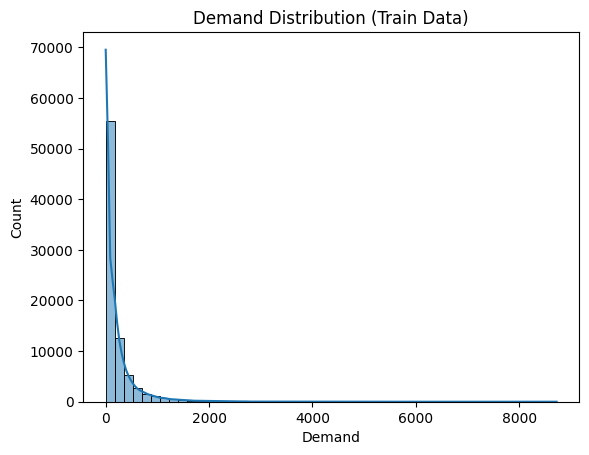

In [11]:
sns.histplot(train_data["Demand"], bins=50, kde=True)
plt.title("Demand Distribution (Train Data)")

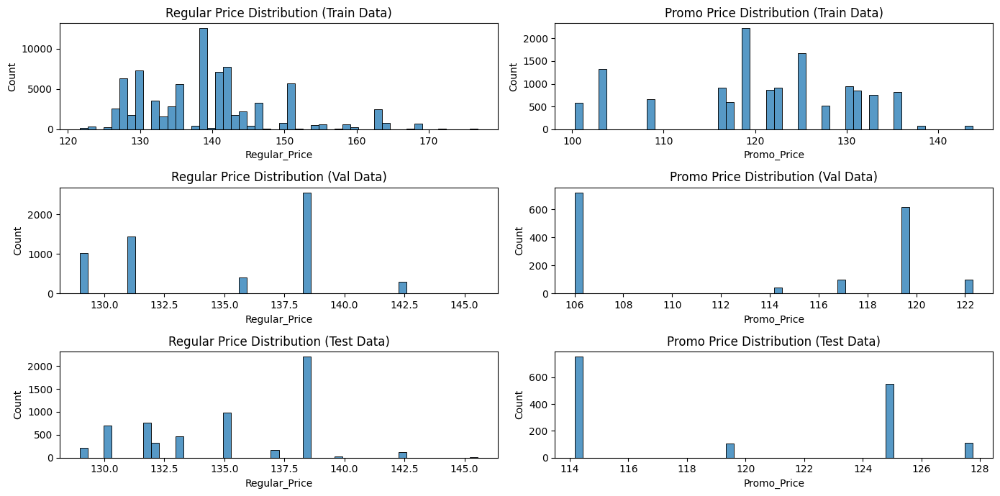

In [12]:
plt.figure(figsize=(14, 7))

plt.subplot(3, 2, 1)
sns.histplot(train_data["Regular_Price"], bins=50)
plt.title("Regular Price Distribution (Train Data)")

plt.subplot(3, 2, 2)
sns.histplot(train_data["Promo_Price"], bins=50)
plt.title("Promo Price Distribution (Train Data)")

plt.subplot(3, 2, 3)
sns.histplot(val_data["Regular_Price"], bins=50)
plt.title("Regular Price Distribution (Val Data)")

plt.subplot(3, 2, 4)
sns.histplot(val_data["Promo_Price"], bins=50)
plt.title("Promo Price Distribution (Val Data)")

plt.subplot(3, 2, 5)
sns.histplot(test_data["Regular_Price"], bins=50)
plt.title("Regular Price Distribution (Test Data)")

plt.subplot(3, 2, 6)
sns.histplot(test_data["Promo_Price"], bins=50)
plt.title("Promo Price Distribution (Test Data)")

plt.tight_layout()
plt.show()

- __Demand Distribution:__

	- The demand is highly right-skewed. There are a few extremely high demand values, which could be considered outliers or exceptional cases.

- __Regular Price Distribution:__

	- The regular price in the training data shows multiple peaks.
	- The most common prices on train are around 125-135 and 139-142, indicating these are frequently used price points.

- __Promo Price Distribution:__

	- The promo price also shows multiple peaks.

__Target feature normalization is likely to perform well on such data.__

## Graph time series

__Сombine store id and sku to get single id for rows.__

In [13]:
train_data["id"] = train_data["Store_id"] + "_" + train_data["SKU_id"]
val_data["id"] = val_data["Store_id"] + "_" + val_data["SKU_id"]
test_data["id"] = test_data["Store_id"] + "_" + test_data["SKU_id"]

In [14]:
# Create a line plot with Plotly
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces for each id
for unique_id in train_data["id"].unique():
    df = train_data[train_data["id"] == unique_id]
    fig.add_trace(
        go.Scatter(x=df["Date"], y=df["Demand"], mode="lines", name=f"Value {unique_id}"),
        secondary_y=False,
    )
    fig.add_trace(
        go.Scatter(
            x=df["Date"],
            y=df["Regular_Price"],
            mode="lines",
            name=f"Regular Price {unique_id}",
            line=dict(dash="dash"),
        ),
        secondary_y=False,
    )
    fig.add_trace(
        go.Scatter(
            x=df["Date"],
            y=df["Promo_Price"],
            mode="lines",
            name=f"Promo Price {unique_id}",
            line=dict(dash="dash"),
        ),
        secondary_y=False,
    )

# Update layout
fig.update_layout(
    title="Time Series Dynamics of Value, Promo, and Price",
    xaxis_title="Date",
    yaxis_title="Value/Price",
    yaxis2_title="Promo",
    legend_title="ID",
    hovermode="x unified",
)

# Show plot
fig.show()

__It can be seen that demand rises strongly during promo periods, so it is good to take into account the exogenous variable promo.__

## Prepare data for tsururu and configure blocks

In [15]:
train_data_tsururu_1 = train_data[["Date", "id", "Demand"]]

In [16]:
dataset_params = {
    "target": {
        "columns": ["Demand"],
        "type": "continious",
    },
    "date": {
        "columns": ["Date"],
        "type": "datetime",
    },
    "id": {
        "columns": ["id"],
        "type": "categorical",
    },
}

In [17]:
pipeline_params = {
    "target": {
        "columns": ["Demand"],
        "features": {
            "LagTransformer": {"lags": [0, 1, 2, 3, 4, 5, 6, 7, 14, 21, 28, 30]},
        },
    },
    "date": {
        "columns": ["Date"],
        "features": {
            "DateSeasonsGenerator": {
                "seasonalities": ["doy", "m", "wd", "d"],
                "from_target_date": True,
            },
            "LagTransformer": {"lags": 3},
        },
    },
    "id": {
        "columns": ["id"],
        "features": {
            "LabelEncodingTransformer": {},
            "LagTransformer": {"lags": 1},
        },
    },
}

In [18]:
model = CatBoost
model_params = {
    "loss_function": "MultiRMSE",
    "early_stopping_rounds": 100,
    "verbose": 500,
}

validation = KFoldCrossValidator
validation_params = {
    "n_splits": 3,
}

trainer = MLTrainer(
    model,
    model_params,
    validation,
    validation_params,
)

In [19]:
horizon = 28
history = 31
step = 1

## Try Baselines!

## Try Statistical models!

## Try ML models in different strategies!

## Try CatBoost!

In [23]:
padded_for_multivariate = pad_multivariate_time_series(train_data_tsururu_1, pad_with=0)

In [35]:
multivariate_list = [False, True]
strategy_list = ["recursive", "direct", "mimo", "flatwidemimo"]
model_horizon_list = [1, 7, 14]

preds = {}
results = {}

for multivariate, strategy in product(multivariate_list, strategy_list):
    current_data = padded_for_multivariate

    dataset = TSDataset(
        data=current_data,
        columns_params=dataset_params,
        print_freq_period_info=True,
    )
    pipeline = Pipeline.from_dict(pipeline_params, multivariate=multivariate)

    if strategy in ["recursive", "direct"]:
        strategy_class = RecursiveStrategy if strategy == "recursive" else DirectStrategy
        for model_horizon in tqdm(model_horizon_list):
            model_name = f"CatBoost_{multivariate}_{strategy}_{model_horizon}"
            strategy_instance = strategy_class(
                horizon, history, step, trainer, pipeline, model_horizon
            )
            strategy_instance.fit(dataset)
            _, preds[model_name] = strategy_instance.predict(dataset)
            results[model_name] = get_metrics_by_id(val_data, preds[model_name])
    else:
        model_name = f"CatBoost_{multivariate}_{strategy}"
        strategy_class = MIMOStrategy if strategy == "mimo" else FlatWideMIMOStrategy
        strategy_instance = strategy_class(horizon, history, step, trainer, pipeline)
        strategy_instance.fit(dataset)
        _, preds[model_name] = strategy_instance.predict(dataset)
        results[model_name] = get_metrics_by_id(val_data, preds[model_name])

  0%|          | 0/8 [00:00<?, ?it/s]

freq: Day; period: 1


  0%|          | 0/3 [00:00<?, ?it/s]

0:	learn: 346.2034112	test: 347.0768727	best: 347.0768727 (0)	total: 4.05ms	remaining: 4.04s
500:	learn: 172.1386901	test: 185.8569856	best: 185.8569856 (500)	total: 1.74s	remaining: 1.73s
999:	learn: 153.6936412	test: 178.9742095	best: 178.9742095 (999)	total: 3.34s	remaining: 0us

bestTest = 178.9742095
bestIteration = 999

Fold 0. Score: 178.97420953750216
0:	learn: 341.8767075	test: 355.9989285	best: 355.9989285 (0)	total: 3.48ms	remaining: 3.47s
500:	learn: 166.6441137	test: 199.1733969	best: 199.1733969 (500)	total: 1.65s	remaining: 1.64s
999:	learn: 147.5946327	test: 192.3942796	best: 192.3942796 (999)	total: 3.24s	remaining: 0us

bestTest = 192.3942796
bestIteration = 999

Fold 1. Score: 192.39427963881423
0:	learn: 351.4081171	test: 336.2556421	best: 336.2556421 (0)	total: 4.44ms	remaining: 4.44s
500:	learn: 173.2543177	test: 182.3943422	best: 182.3943422 (500)	total: 1.68s	remaining: 1.67s
999:	learn: 152.7361359	test: 175.0576787	best: 175.0576787 (999)	total: 3.36s	remainin

  0%|          | 0/3 [00:00<?, ?it/s]

0:	learn: 346.2034112	test: 347.0768727	best: 347.0768727 (0)	total: 6.64ms	remaining: 6.63s
500:	learn: 172.1386901	test: 185.8569856	best: 185.8569856 (500)	total: 1.78s	remaining: 1.77s
999:	learn: 153.6936412	test: 178.9742095	best: 178.9742095 (999)	total: 4.01s	remaining: 0us

bestTest = 178.9742095
bestIteration = 999

Fold 0. Score: 178.97420953750216
0:	learn: 341.8767075	test: 355.9989285	best: 355.9989285 (0)	total: 5.38ms	remaining: 5.37s
500:	learn: 166.6441137	test: 199.1733969	best: 199.1733969 (500)	total: 1.85s	remaining: 1.85s
999:	learn: 147.5946327	test: 192.3942796	best: 192.3942796 (999)	total: 3.72s	remaining: 0us

bestTest = 192.3942796
bestIteration = 999

Fold 1. Score: 192.39427963881423
0:	learn: 351.4081171	test: 336.2556421	best: 336.2556421 (0)	total: 4.95ms	remaining: 4.95s
500:	learn: 173.2543177	test: 182.3943422	best: 182.3943422 (500)	total: 1.88s	remaining: 1.88s
999:	learn: 152.7361359	test: 175.0576787	best: 175.0576787 (999)	total: 3.69s	remainin

## Try normalizers on best strategy!

## Try exogeneous features on best strategy + normalizer!

## Try DLinear!

In [ ]:
dataset = TSDataset(
    data=padded_for_multivariate,
    columns_params=dataset_params,
    print_freq_period_info=True,
)

In [ ]:
lag = LagTransformer(lags=30)
target_generator = TargetGenerator()

union_1 = UnionTransformer(transformers_list=[lag, target_generator])
seq_1 = SequentialTransformer(transformers_list=[union_1], input_features=["Demand"])
union = UnionTransformer(transformers_list=[seq_1])

pipeline = Pipeline(union, multivariate=True)

In [ ]:
# Configure the model parameters
model = DLinear_NN
model_params = {"moving_avg": 7, "individual": False, "enc_in": None}

validation = KFoldCrossValidator
validation_params = {
    "n_splits": 3,
}

trainer_params = {
    "device": "cpu",
    "num_workers": 0,
    "stop_by_metric": True,
}

trainer = DLTrainer(
    model, 
    model_params, 
    validation, 
    validation_params, 
    **trainer_params
)

In [ ]:
horizon = 28
model_horizon = 28
history = 30
step = 1

In [ ]:
strategy = MIMOStrategy(
    pipeline=pipeline,
    trainer=trainer,
    horizon=horizon,
    history=history,
    step=step,
)

In [ ]:
strategy.fit(dataset)

## Try Ensembles on best models!

## Try Hierarchy!